<p style="font-family: Arial; font-size:3.75em;color:purple; font-style:bold"><br>
Satellite Image Data <br><br><br>Analysis using numpy</p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>Data Source: Satellite Image from WIFIRE Project</p>


WIFIRE is an integrated system for wildfire analysis, with specific regard to changing urban dynamics and climate. 

The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data

It then processes this data via computational techniques in signal processing, visualization, predictive modeling, and data assimilation to provide a scalable method to monitor such phenomena as weather patterns that results in a system that can help predict a wildfire's rate of spread (and other weather patterns). You can read more about WIFIRE at: https://wifire.ucsd.edu/

In this example, we will analyze a sample satellite image dataset from WIFIRE using the numpy Library.


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">Loading the libraries we need: numpy, scipy, matplotlib</p>

In [1]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Creating a numpy array from an image file:</p> 

<br>
Lets choose a WIFIRE satellite image file that can be used for analysis of the Earth's surface.

It's very common for any Earth Science application to include an analysis of visual graphs in the form of maps, photos, or satellite imagery.

Many other data science applications will also involve a form of image processing

as an ndarray and display its type.


CPU's store images as a series of tiny squares (**pixels**).

If they squares are too big, it's hard to make smooth edges + curves. We want more, small tiles for a less-pixelated, and therefore smoother image = **resolution** of the image.

Vector graphics are a somewhat different method of storing images that aims to avoid pixel-related issues.

Each pixel is just 1 color made up of 3 colors (RGB)

In an **RBG image**, each pixel is represented by three 8-bit #'s associated to the values red, green, + blue respectively, and the combination of these will, in turn, give a specific shade of a color.

Since each # is an 8--bit #, the values range from 0-255
* all 3 colors at full intensity/max values = white
* all 3 colors muted/min values = black

Since each value can have 256 different intensities/brightness values, it makes 16.8 million total shades.

In Python, RGB images are ndarrays of shape [height * width * 3] for each RGB layer.

We will import a high-resolution image from the NASA satellite LANsat + mainly use Numpy functions, filtering techniques, and some domain Earth science knowledge to analyze this image.

*So how do we use the results of this analysis in predictive fire modeling in the end?*

We will make a fuel data set which will be one of the many other data sets we use for fire modeling.

We can make many real-time analysis results a part of the fire modeling.

Once integrated with other sources of information, better and automated fuel models can lead to more accurate results.

In [2]:
from skimage import data

# read in the satellite image into an ndarray
photo_data = misc.imread('./wifire/sd-3layers.jpg')

type(photo_data)

numpy.ndarray

Let's see what is in this image. 

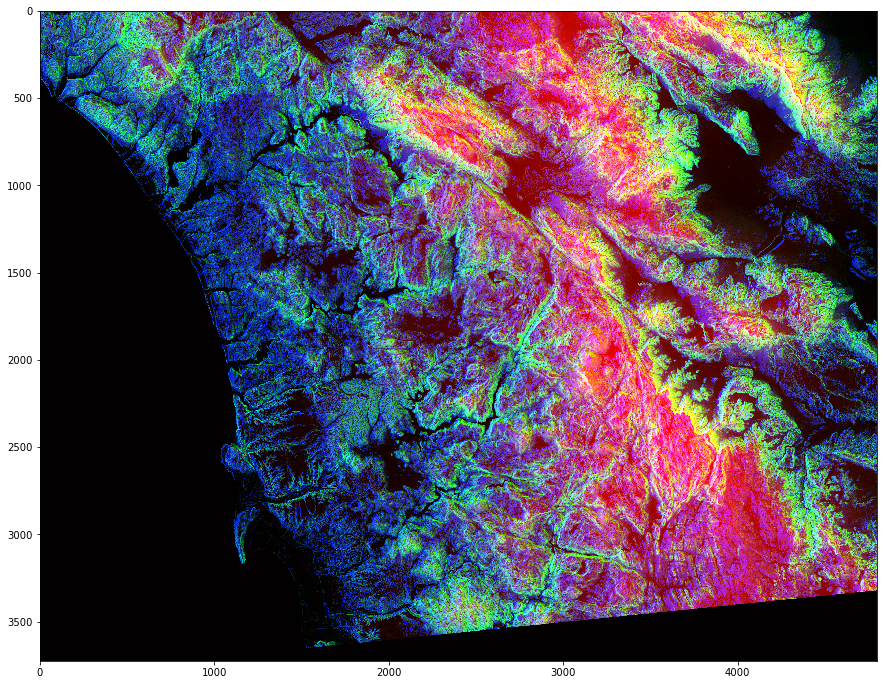

In [5]:
plt.figure(figsize=(15,15)) # 15x15 plot area
plt.imshow(photo_data)

In [4]:
# this is a 3D ndarray - check the dimensions
photo_data.shape

#print(photo_data)

(3725, 4797, 3)

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
RGB Color Mapping in the Photo:</p> <br>
<ul>
<li><p style="font-family: Arial; font-size:1.75em;color:red; font-style:bold">
RED pixel indicates Altitude of the geographical data point of the pixel</p>
<li><p style="font-family: Arial; font-size:1.75em;color:blue; font-style:bold">
BLUE pixel indicates Aspect 
</p>
<li><p style="font-family: Arial; font-size:1.75em;color:green; font-style:bold">
GREEN pixel indicates Slope
</p>
</ul>
<br>
The higher values denote higher altitude, aspect and slope.


In [6]:
photo_data.size

53606475

In [9]:
# investigaet pixel values

print(photo_data.min(), photo_data.max())
print(photo_data.mean())

0 255
75.829893068


In [8]:
photo_data.mean()

75.829893067954941

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Pixel on the 150th Row and 250th Column</p>

In [10]:
# check RGB values for specific pixel (row 150, col 250)

photo_data[150, 250]

array([ 17,  35, 255], dtype=uint8)

In [11]:
# check GREEN value for specific pixel (row 150, col 250)

photo_data[150, 250, 1]

35

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Set a Pixel to All Zeros</p>
<br/>
We can set all three layers in a pixel as once by assigning zero globally to that (row,column) pairing. However, setting one pixel to zero is not noticeable.

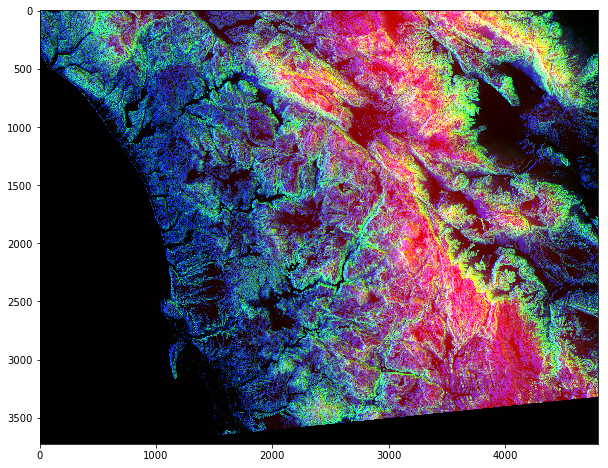

In [12]:
#photo_data = misc.imread('./wifire/sd-3layers.jpg')

# set 1 pixel to be all zeroes (black)

photo_data[150, 250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Changing colors in a Range<p/>
<br/>
We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 t0 800 to full intensity.

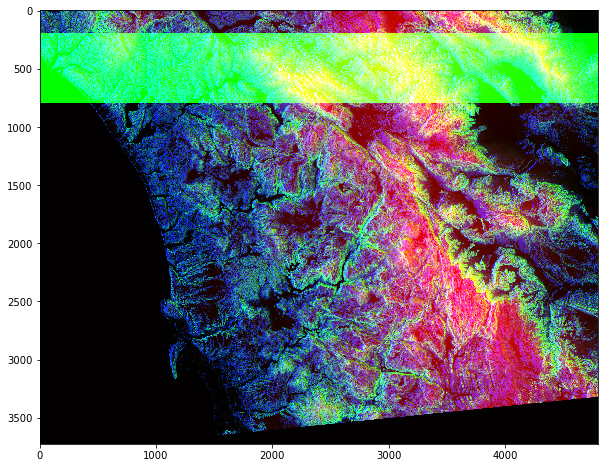

In [3]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# for data points in rows 200-800, all columns, in layer 2 (green), make full intensity
photo_data[200:800, : , 1] = 255

plt.figure(figsize=(10,10))
plt.imshow(photo_data)

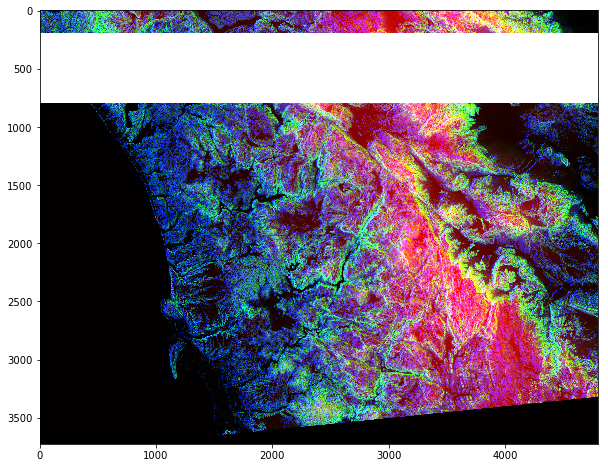

In [15]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# for data points in rows 200-800, all columns, all layers, make full intensity (white)
photo_data[200:800, :] = 255

plt.figure(figsize=(10,10))
plt.imshow(photo_data)

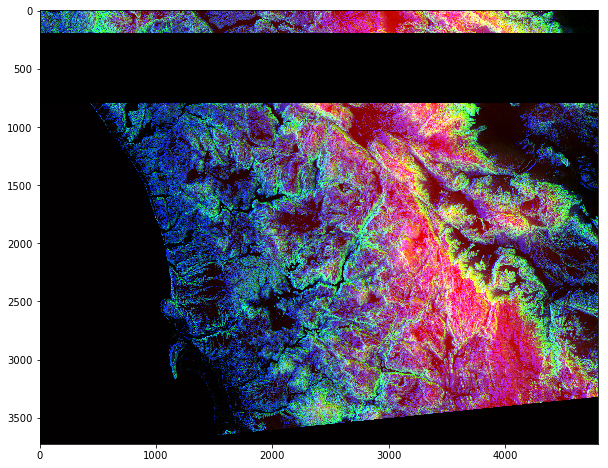

In [16]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# for data points in rows 200-800, all columns, all layres, make min intensity (black)
photo_data[200:800, :] = 0

plt.figure(figsize=(10,10))
plt.imshow(photo_data)

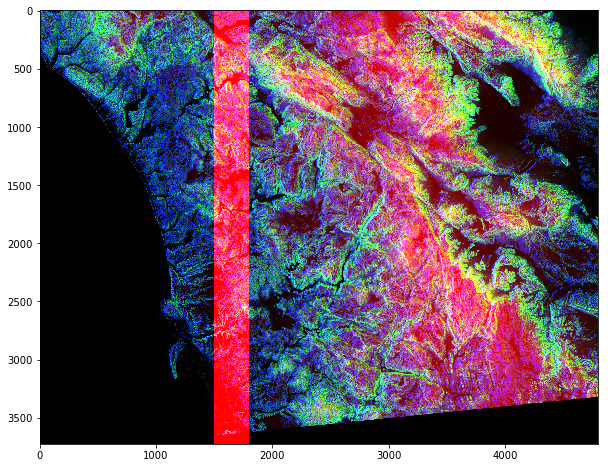

In [22]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# for data points in rows 200-800, all columns, all layres, make min intensity (black)
photo_data[:, 1500:1800, 0] = 255

plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Pick all Pixels with Low Values</p>

In [29]:
# reload img
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# print out dimensions
print("Shape of photo_data:", photo_data.shape)

# get each pixel with a value < 200 into a variable
low_value_filter = photo_data < 200

# print out dimensions of the low-value filter (same shape as original ndarray)
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Filtering Out Low Values</p><br/>
Whenever the low_value_filter is True, set value to 0. This will filter out pixels w/ low intensity, or **points of less interest**

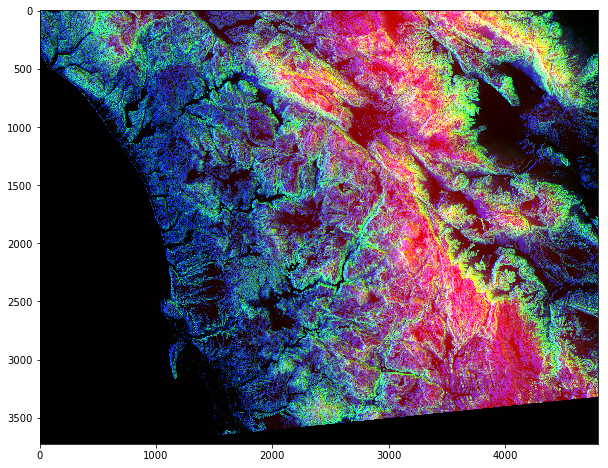

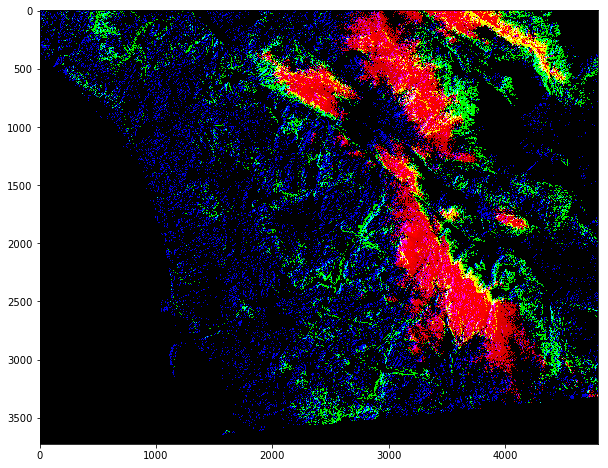

In [30]:
#import random

# create plot + show img
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

# use the indexes of the low-value pixels to set their 3 layer value to 0
photo_data[low_value_filter] = 0

# create plot + show img
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
More Row and Column Operations</p><br>
You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [31]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range

# this creates a straight linear line (diagonal)

print(type(rows_range))

<class 'numpy.ndarray'>


In [32]:
# make the pixels making up the diagonal white in the img
photo_data[rows_range, cols_range] = 255

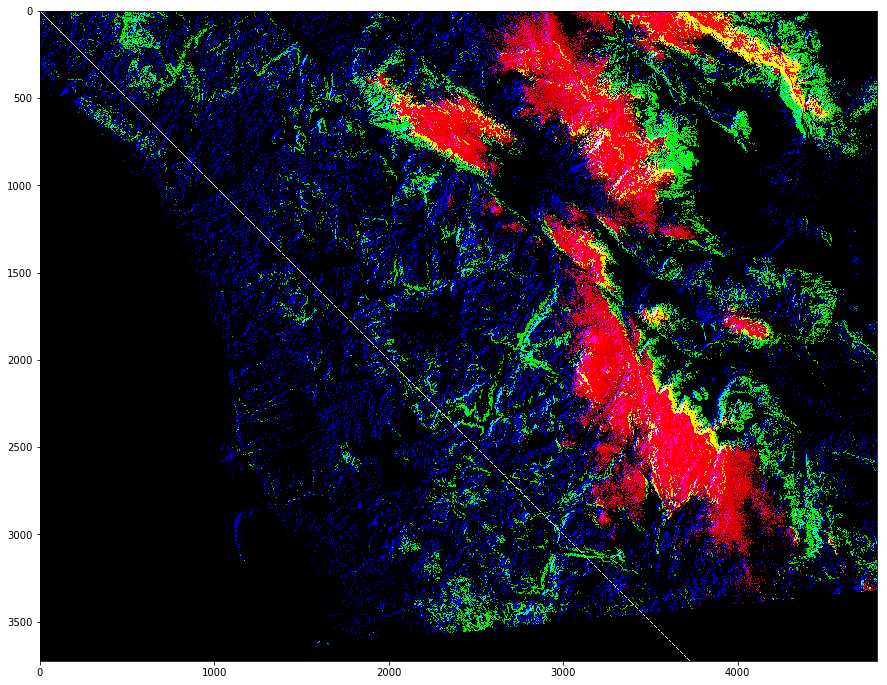

In [33]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Masking Images</p>
<br>Now let us try something even cooler...a mask that is in shape of a circular disc.

<img src="./circle.png" align="left" style="width:550px;height:360px;"/>

Need to calculate **Euclidean distance** from all points within a radius from the center. We will create a filter for all points beyond the radius.

In [8]:
# create 3 variables which store certain aspects of the photo

print("photo_data = ", photo_data.shape)
total_rows, total_cols, total_layers = photo_data.shape

print()

# use ogrid() to vectorize the distance from the center as a function of 2 variables, x and y
# we will get 2 vectors (range of total rows and range of total cols)
# ogrid() is a compact method of creating multidimensional ndarray operations in single lines

print("X = ", X.shape, " and Y = ", Y.shape)
X, Y = np.ogrid[:total_rows, :total_cols]

photo_data =  (3725, 4797, 3)

X =  (3725, 1)  and Y =  (1, 4797)


In [15]:
#calculate the center, (x,y), which is the middle point of the rows and cols

center_row, center_col = total_rows / 2, total_cols / 2
print("center_row = ", center_row, "AND center_col = ", center_col)
#print(X - center_row)
#print(Y - center_col)

center_row =  1862.5 AND center_col =  2398.5


In [16]:
# calculate distance from the center of each point in X and Y

dist_from_center = (X - center_row)**2 + (Y - center_col)**2
print(dist_from_center)

[[ 9221708.5  9216912.5  9212118.5 ...,  9207326.5  9212118.5  9216912.5]
 [ 9217984.5  9213188.5  9208394.5 ...,  9203602.5  9208394.5  9213188.5]
 [ 9214262.5  9209466.5  9204672.5 ...,  9199880.5  9204672.5  9209466.5]
 ..., 
 [ 9210542.5  9205746.5  9200952.5 ...,  9196160.5  9200952.5  9205746.5]
 [ 9214262.5  9209466.5  9204672.5 ...,  9199880.5  9204672.5  9209466.5]
 [ 9217984.5  9213188.5  9208394.5 ...,  9203602.5  9208394.5  9213188.5]]


In [17]:
# calculate the radius
radius = (total_rows / 2)**2
print("Radius = ", radius)

Radius =  3468906.25


In [19]:
# get each data point that is further from the center than the radius (outside the circle)
circular_mask = (dist_from_center > radius)
print(circular_mask)

[[ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 ..., 
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]]


In [22]:
# check boolean logic for the center of the figure
print(circular_mask[1500:1700,2000:2200])

[[False False False ..., False False False]
 [False False False ..., False False False]
 [False False False ..., False False False]
 ..., 
 [False False False ..., False False False]
 [False False False ..., False False False]
 [False False False ..., False False False]]


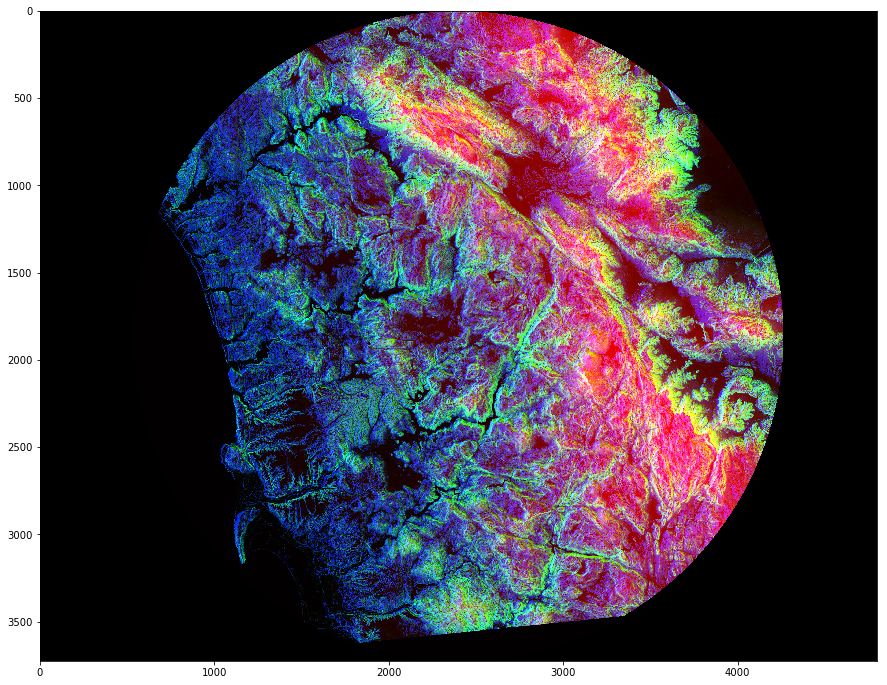

In [23]:
# retrieve the photo
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# set the RGB value of each data point that is further from the radius to intensity of 0's (black)
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Further Masking</p>
<br/>You can further improve the mask, for example just get upper half disc.

In [41]:
# store the total # of rows and cols in X, Y again

X, Y = np.ogrid[:total_rows, :total_cols]

# get all rows ABOVE the center point (above the middle-X value of center_row = 1862.5)

half_upper = X < center_row
# create mask/filter to get all points that are TRUE in both our original circle filter and the upper filter
# use .logical_and() to combine the filters
# this gets all points that are in the upper half of the image AND outside the circle radius

half_upper_mask = np.logical_and(half_upper, circular_mask)

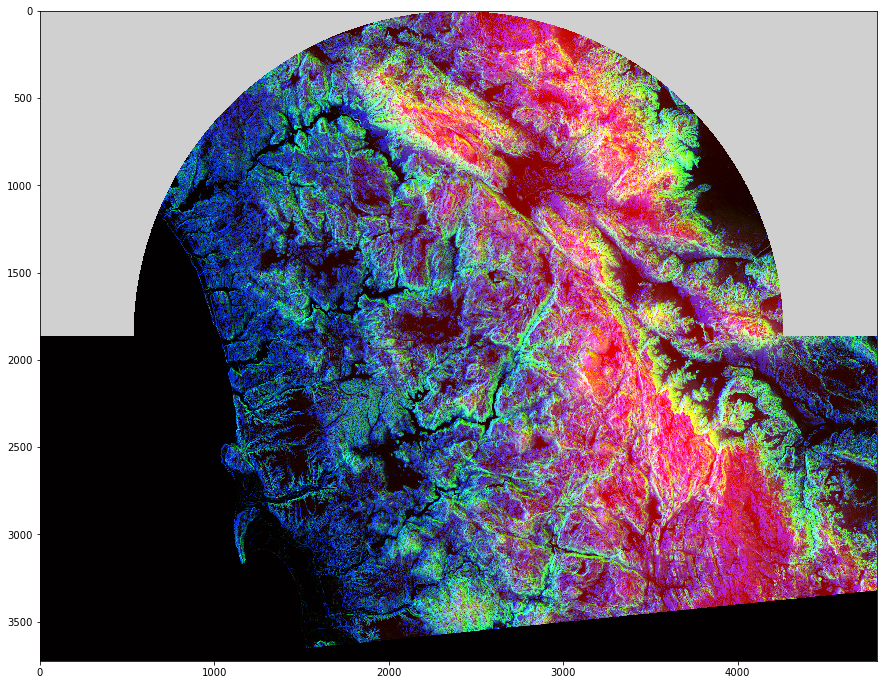

In [37]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# assing all data points in the upper half and outside the circle and set RGB values to max (white)
photo_data[half_upper_mask] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

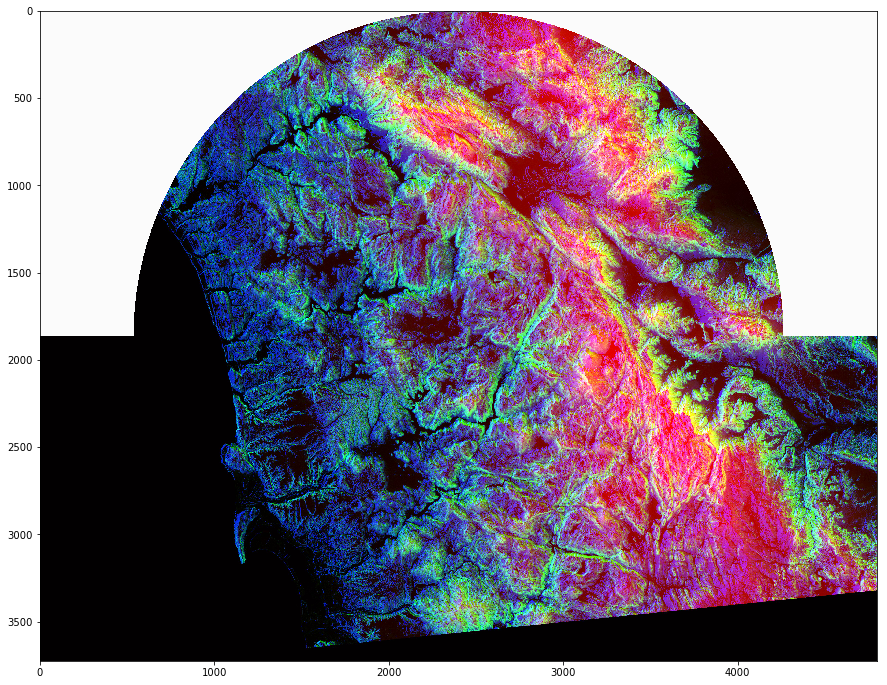

In [38]:
import random
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# assing all data points in the upper half and outside the circle and set RGB values to a random int between 200-255
photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

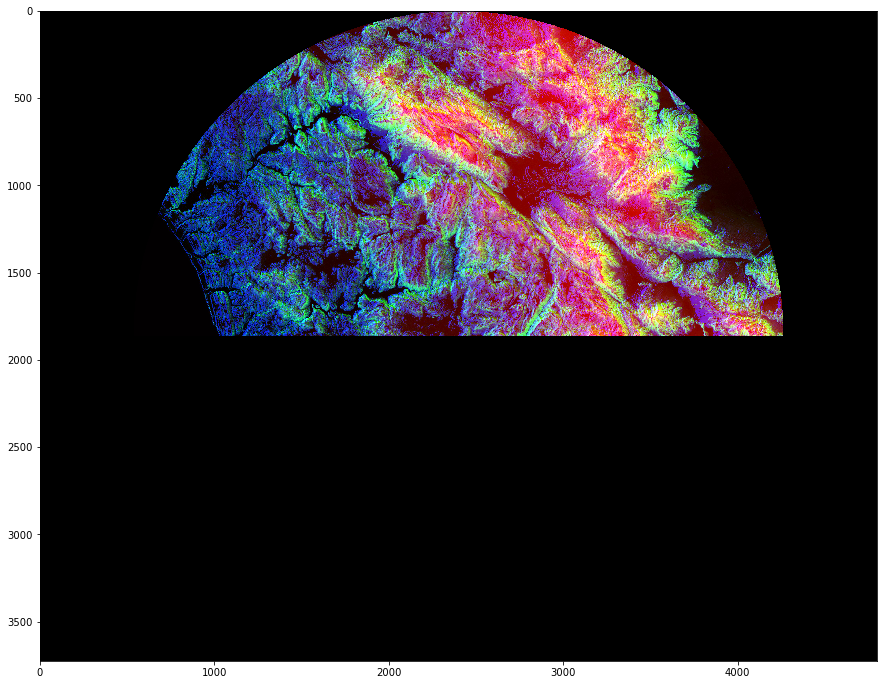

In [43]:
# store the total # of rows and cols in X, Y again

X, Y = np.ogrid[:total_rows, :total_cols]

# get all rows BELOW the center point (above the middle-X value of center_row = 1862.5)

half_lower = X > center_row
half_lower_mask = np.logical_or(half_lower, circular_mask)

photo_data = misc.imread('./wifire/sd-3layers.jpg')

# assing all data points in the lower half and outside the circle and set RGB values to min (black)
photo_data[half_lower_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:2.75em;color:purple; font-style:bold"><br>
Further Processing of our Satellite Imagery </p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Processing of RED Pixels</p>

Remember that red pixels tell us about the height. Let us try to *highlight all the high altitude areas* by detecting high intensity RED Pixels and muting down other areas.

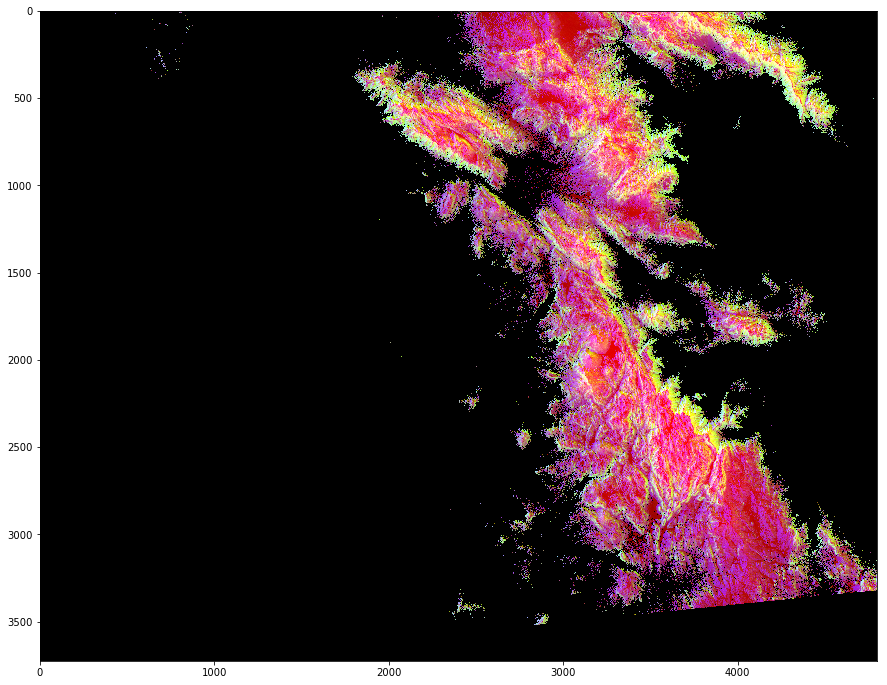

In [45]:
# get photo
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# create filter for all data points where its red layer (index 2 value of 0) is less than 150
red_mask   = photo_data[:, : ,0] < 150

# set all data points whose red layer value is less than 150/less intense/not as high-altitude and ignore
photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highl-GREEN Pixels</p>

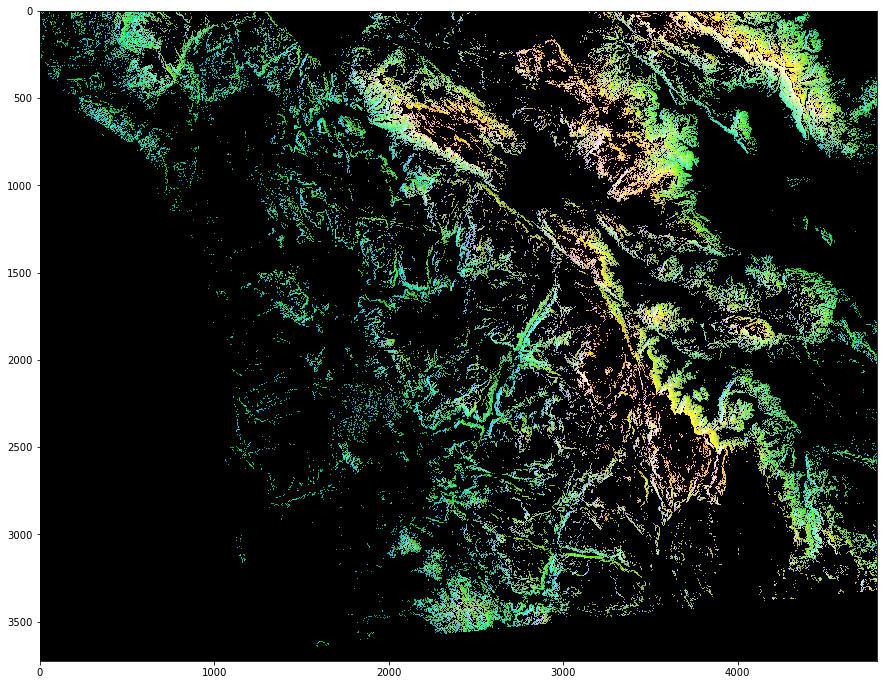

In [48]:
# get photo
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# filter out low-slope data
green_mask = photo_data[:,:,1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-BLUE Pixels</p>

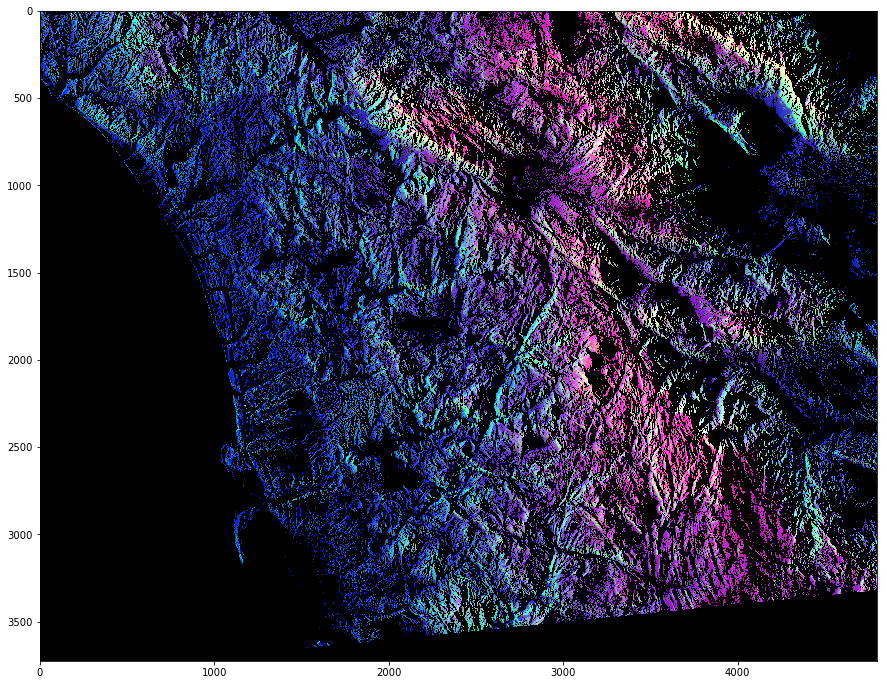

In [49]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
blue_mask  = photo_data[:, : ,2] < 150

# filter out low-aspect data
photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

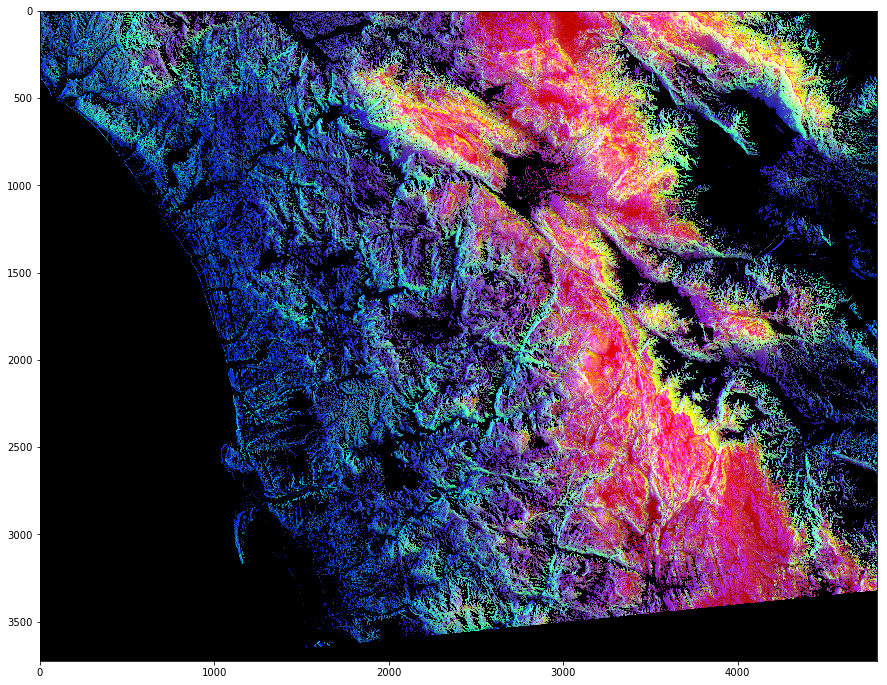

In [51]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

# get high-elevation, high-aspect, low-slope data points
red_mask = photo_data[:,:,0] < 150
blue_mask = photo_data[:,:,2] < 100
green_mask = photo_data[:,:,1] > 100

# merge into 1 filter
composite_mask = np.logical_and(red_mask,blue_mask,green_mask)

photo_data[composite_mask] = 0
plt.figure(figsize = (15,15))
plt.imshow(photo_data)